# Empirical Mode Decomposition (EMD) tutorial
### Scott Cole
### 9 January 2016

This notebook illustrates how empirical mode decomposition (EMD) decomposes a signal into multiple rhythmic components.

**Outline**

1. EMD function code
2. Example decomposition
3. Decomposition algorithm

END THIS NOTEBOOK AND CREATE ANOTHER FOR MORE DETAILED STUFF
4. Example decomposition of an oscillatory neural signal
5. Advantages and disadvantages
* Compare its ability to extract a 1Hz and 10Hz signal from each other. Can it do it? Different amplitude ratios?
5. Phase-amplitude coupling application of EMD


TODO
1. Note frequency of components in #2
2. Fill in text for #3

* Write a version that chooses the criteria (stop criteria) depending on what percentage of variance the best component explains, tryng to maximize that. (start small with a number dependent on the energy in the signal, and go until you hit a peak, after anothe certain energy level)

**Some background**
* This method was termed **empirical** mode decomposition because it contrasts to theoretical decomposition, like that based on the Fourier Transform. Therefore, it has some advantages when dealing with complicated real-life signals such as those that are nonstationary (i.e. not at the same frequency throughout time). For nonstationary signals, applying a bandpass filter over a certain frequency range may not be ideal, as it will likely attenuate some aspects of the signal you want to measure.
* This method stays true to our data by sticking in the time domain and not mapping to something like the frequency domain where we sometimes implicitly make questionable assumptions for our analysis.
* [Intrinsic mode functions](https://en.wikipedia.org/wiki/Hilbert%E2%80%93Huang_transform#Intrinsic_Mode_Functions_.28IMF.29) (IMFs) are the fancy names given to the EMD components because the satisfy the following criteria:
    1. In the whole data set, the number of extrema and the number of zero-crossings must either be equal or differ at most by one.
    2. At any point, the mean value of the envelope defined by the local maxima and the envelope defined by the local minima is zero.
* Resultant IMFs therefore are always (given sufficient stringency) monotonic between their peaks (above 0) and troughs (below 0). Therefore, the Hilbert transform which is commonly used to extract the instantaneous phase and amplitude of a signal will yield clean results. This strategy of applying EMD and Hilbert transform to get instantaneous frequency of a nonstationary function is called the [Hilbert-Huang Transform](https://en.wikipedia.org/wiki/Hilbert%E2%80%93Huang_transform). 
* There are a [variety of applications](https://en.wikipedia.org/wiki/Hilbert%E2%80%93Huang_transform#Current_Applications) outside of neuroscience including finance, geophysics, and many other fields of physics. However, I question applications that subsequently apply Fourier analysis onto these components... [they could have gotten just as good of seizure discrimination using regular Fourier analysis instead of EMD](http://www.hindawi.com/journals/jece/2008/293056/).

# 1. EMD function code

**Load libraries**

In [159]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
import seaborn as sns
sns.set_style('white')

import numpy as np
import scipy as sp
from scipy import signal
import matplotlib.pyplot as plt

**EMD functions**

In [202]:
def emd(x, nIMF = 3, stoplim = .001):
    """Perform empirical mode decomposition to extract 'niMF' components out of the signal 'x'."""
    
    r = x
    t = np.arange(len(r))
    imfs = np.zeros(nIMF,dtype=object)
    for i in range(nIMF):
        r_t = r
        is_imf = False
        
        while is_imf == False:
            # Identify peaks and troughs
            pks = sp.signal.argrelmax(r_t)[0]
            trs = sp.signal.argrelmin(r_t)[0]
            
            # Interpolate extrema
            pks_r = r_t[pks]
            fip = sp.interpolate.InterpolatedUnivariateSpline(pks,pks_r,k=3)
            pks_t = fip(t)
            
            trs_r = r_t[trs]
            fitr = sp.interpolate.InterpolatedUnivariateSpline(trs,trs_r,k=3)
            trs_t = fitr(t)
            
            # Calculate mean
            mean_t = (pks_t + trs_t) / 2
            mean_t = _emd_complim(mean_t, pks, trs)
            
            # Assess if this is an IMF (only look in time between peaks and troughs)
            sdk = _emd_comperror(r_t, mean_t, pks, trs)
            
            # if not imf, update r_t and is_imf
            if sdk < stoplim:
                is_imf = True
            else:
                r_t = r_t - mean_t
                
        
        imfs[i] = r_t
        r = r - imfs[i] 
        
    return imfs


def _emd_comperror(h, mean, pks, trs):
    """Calculate the normalized error of the current component"""
    samp_start = np.max((np.min(pks),np.min(trs)))
    samp_end = np.min((np.max(pks),np.max(trs))) + 1
    return np.sum(np.abs(mean[samp_start:samp_end]**2)) / np.sum(np.abs(h[samp_start:samp_end]**2))

def _emd_complim(mean_t, pks, trs):
    samp_start = np.max((np.min(pks),np.min(trs)))
    samp_end = np.min((np.max(pks),np.max(trs))) + 1
    mean_t[:samp_start] = mean_t[samp_start]
    mean_t[samp_end:] = mean_t[samp_end]
    return mean_t
    

# 2. Example decomposition

**Import data**

In [203]:
minN = 7000
maxN = 9000
x = np.load('./exampledata.npy')
x = x[minN:maxN+1]
t = np.arange(0,len(x)*.001,.001) 

**Calculate and plot components**

In [204]:
imfs = emd(x, nIMF = 3)

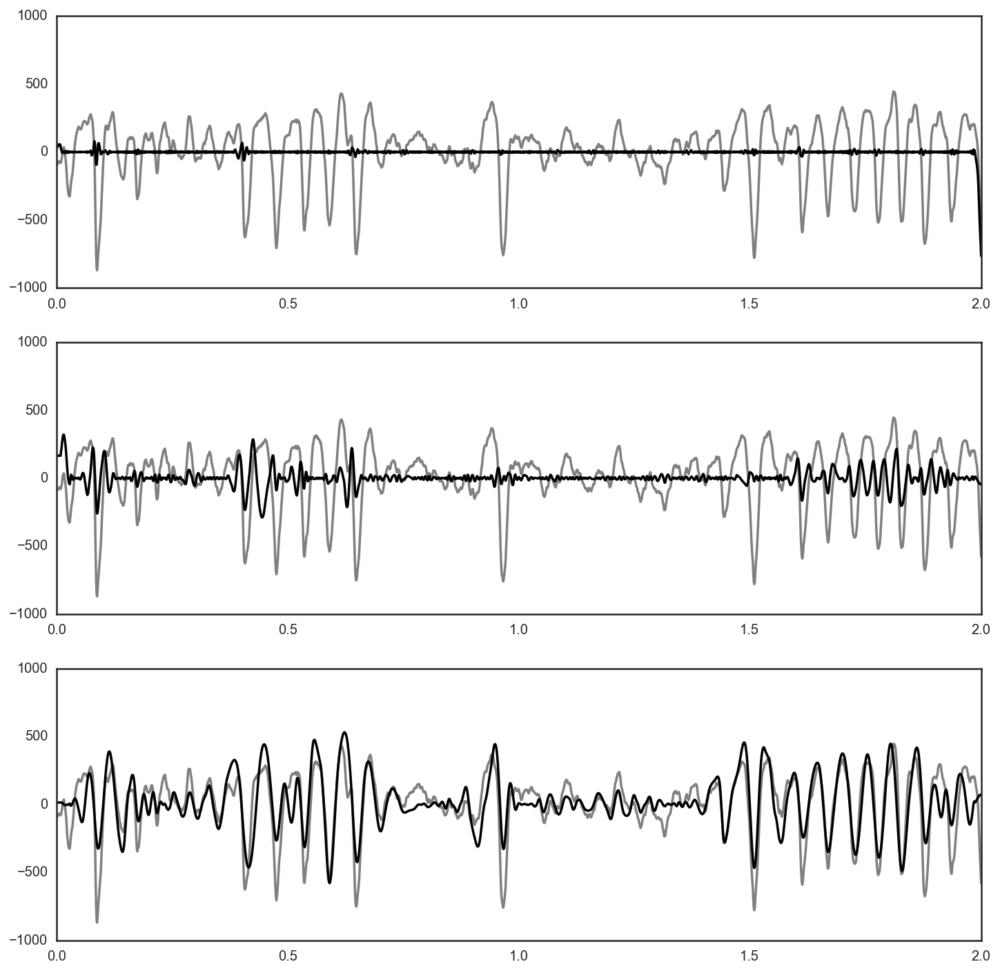

In [205]:
plt.figure(figsize=(12,12))
for i in range(len(imfs)):
    plt.subplot(len(imfs),1,i+1)
    plt.plot(t,x,color='0.5')
    plt.plot(t,imfs[i],'k')
    plt.ylim([-1000,1000])

WRITE DESCRIPTION OF COMPONENTS
* frequency
* oscillation is spread across components

# 3. EMD algorithm

EMD is an interative algorithm. Begin with a signal and repetitively modify it until it satisfies a certain criterion. Modify the original signal, and repeat the procedure to obtain each component.

The next section outlines the algorithm, broken down as:

1. the steps that are iteratively applied to a signal to get a component.
2. the criterion for a processed signal to be a component
3. continuation to get all components

**Define decomposition parameters**

In [179]:
nIMF = 3 # Number of components in which to decompose the signal
stoplim = .001 # Criterion to stop iteration and declare a signal to be a component

### Iteration Step 1. Find all relative extrema

In [180]:
x_temp = x
pks = signal.argrelmax(x_temp)[0]
trs = signal.argrelmin(x_temp)[0]

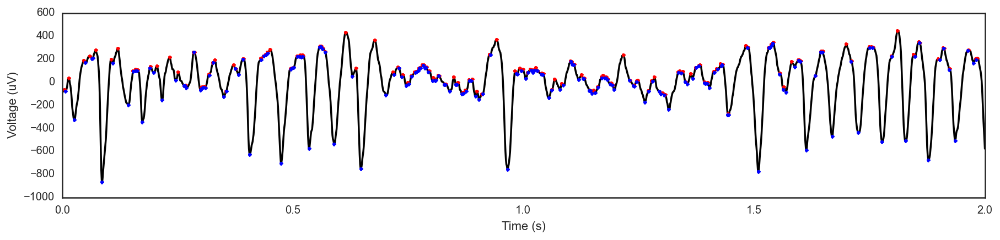

In [181]:
# Plot
plt.figure(figsize=(15,3))
plt.plot(t,x_temp,'k')
plt.plot(t[pks],x_temp[pks],'r.')
plt.plot(t[trs],x_temp[trs],'b.')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (uV)')

### Iteration Step 2. Interpolate extrema

In [182]:
x_pks = x[pks]
fip = sp.interpolate.InterpolatedUnivariateSpline(pks,x_pks,k=3)
pks_t = fip(range(len(x)))

x_trs = x_temp[trs]
fitr = sp.interpolate.InterpolatedUnivariateSpline(trs,x_trs,k=3)
trs_t = fitr(range(len(x)))

(-1000, 1000)

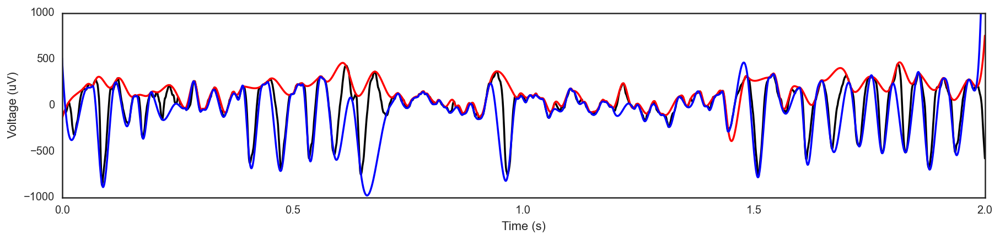

In [183]:
# Plot
plt.figure(figsize=(15,3))
plt.plot(t,x,'k')
plt.plot(t,pks_t,'r')
plt.plot(t,trs_t,'b')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (uV)')
plt.ylim([-1000,1000])

### Iteration Step 3. Calculate mean of extrema envelopes

In [184]:
mean_t = (pks_t + trs_t) / 2

(-1000, 500)

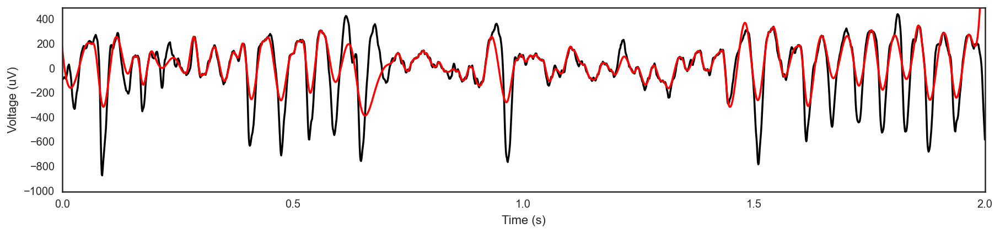

In [185]:
# Plot
plt.figure(figsize=(15,3))
plt.plot(t,x,'k')
plt.plot(t,mean_t,'r')
#plt.plot(t,x-mean_t,'g')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (uV)')
plt.ylim([-1000,500])

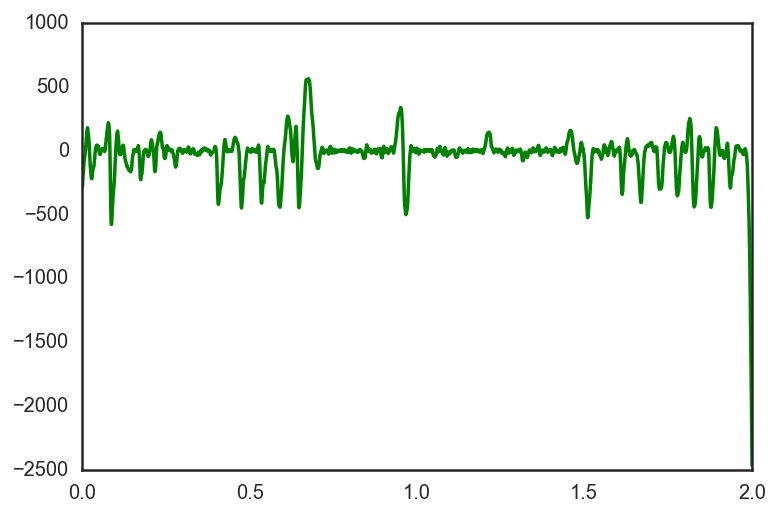

In [186]:
plt.plot(t,x-mean_t,'g')

Notice the high frequency components of the signal are best preserved

### Iteration Step 4. Determine if signal satisfies the requirement to be a component

WRITE INTUITION

In [171]:
samp_start = np.max((np.min(pks),np.min(trs)))
samp_end = np.min((np.max(pks),np.max(trs))) + 1
sdk = np.sum(np.abs(mean_t[samp_start:samp_end]**2)) / np.sum(np.abs(x_temp[samp_start:samp_end]**2))

if sdk < stoplim:
    is_imf = True
else:
    x_temp = x_temp - mean_t
    is_imf = False

If the signal satisfies the criterion:

1. It is defined as a component
2. The component is subtracted from the original signal
3. The iterative steps 1-4 are repeated starting with the signal from (2)

If the signal does not satisfy the criterion:

1. The mean of the extrema envelopes is subtracted from the original signal.
2. The iterative steps 1-4 are repeated starting with the signal from (1)

### Plots illustrating the iteration to find each component

do each plot is 1 component and each row of subplots is 1 step

0.428803248552
0.513652842962
0.388126132713
0.184382457006
0.163484887742
0.0358840200812
0.186291778568
0.0252794118199
0.0150812298012
0.0412192115235
0.0124697982845
0.00742149652128
0.00983893516064
0.00457511043656
0.0108456984483
0.00432072473016
0.00455106888256
0.0321262825656
0.0580880870974
0.016079490088
0.214944446738
0.0284608672981
0.0179298288852
0.0209098647638
0.0133942402728
0.0134029099273
0.00589632242724
0.00198252797151
0.00828027449668
0.0183517840791
0.00269092027711
0.00139153062233
0.00137873953228
0.00108382900378
0.0110887767271
0.00897545235902
0.0075305521263
0.00720200596464
0.00158839452647
0.00484395270022
0.00281298012689
0.00101178338702
0.000600140410873
0.536278698085
0.128784435946
0.122508411486
0.0414632592736
0.0817827249002
0.0144465903886
0.165916846182
0.00988115708444
0.127955034309
0.00360266350604
0.0019184611236
0.00835898171968
0.176610903936
0.0296666627539
0.00565093780124
0.0242849903654
0.117382821868
0.00464002676675
0.003388508883

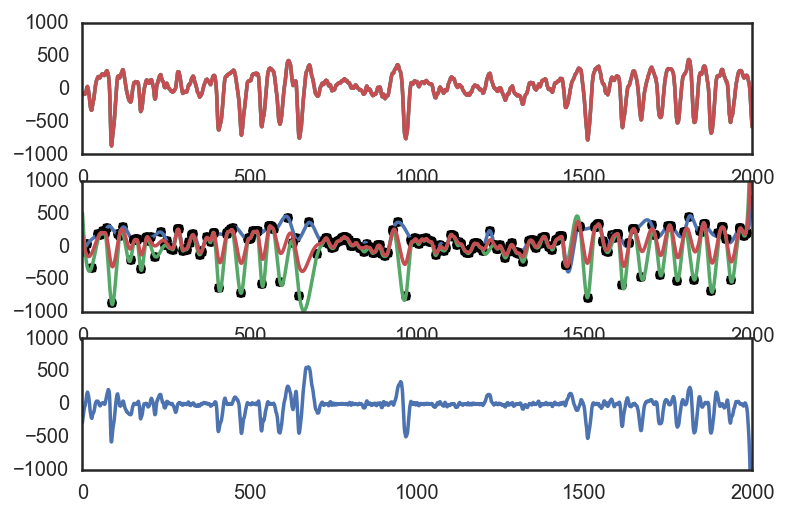

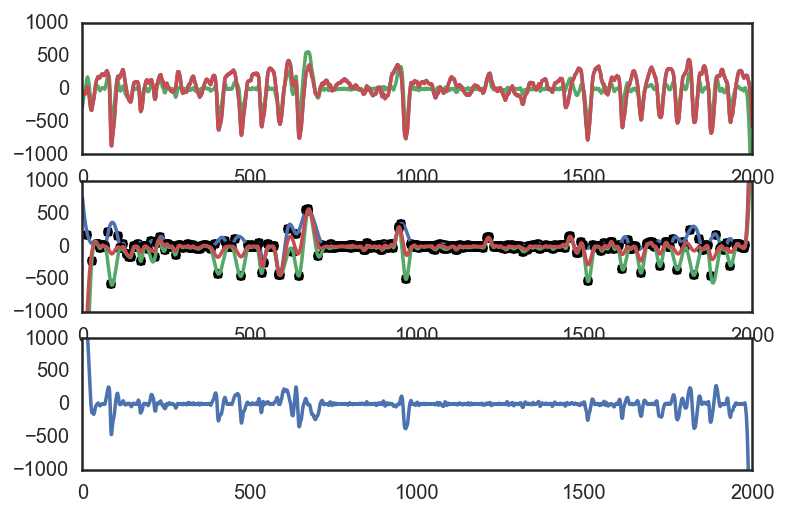

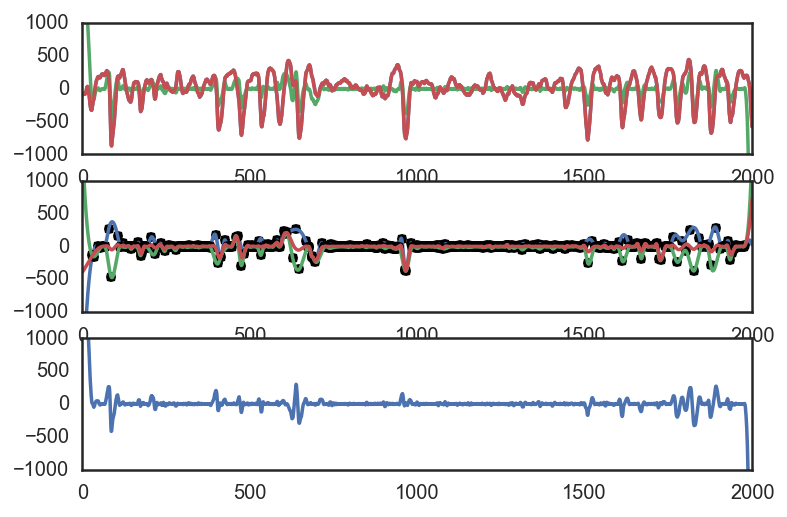

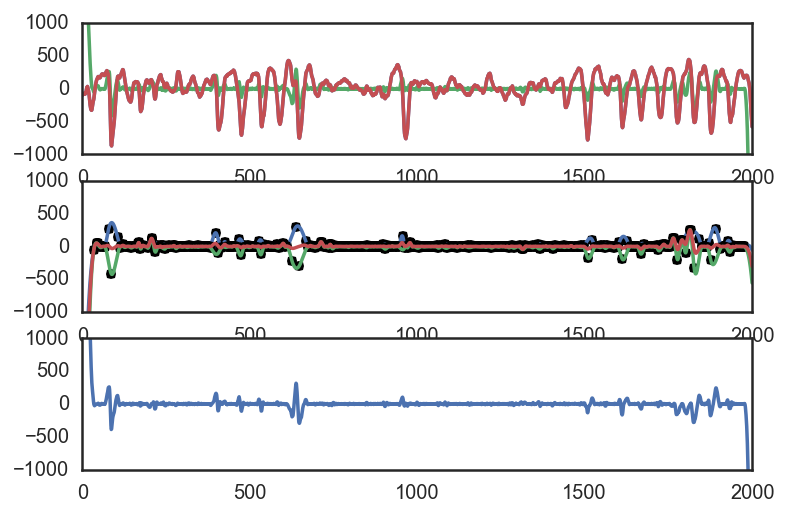

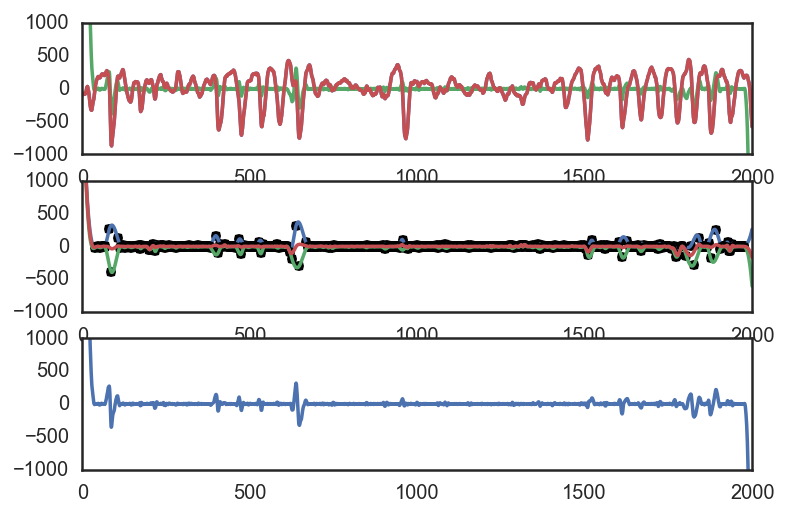

...

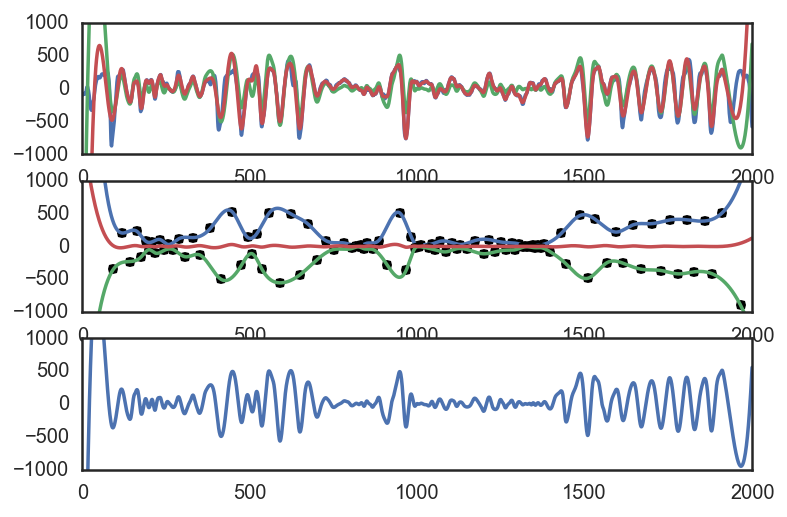

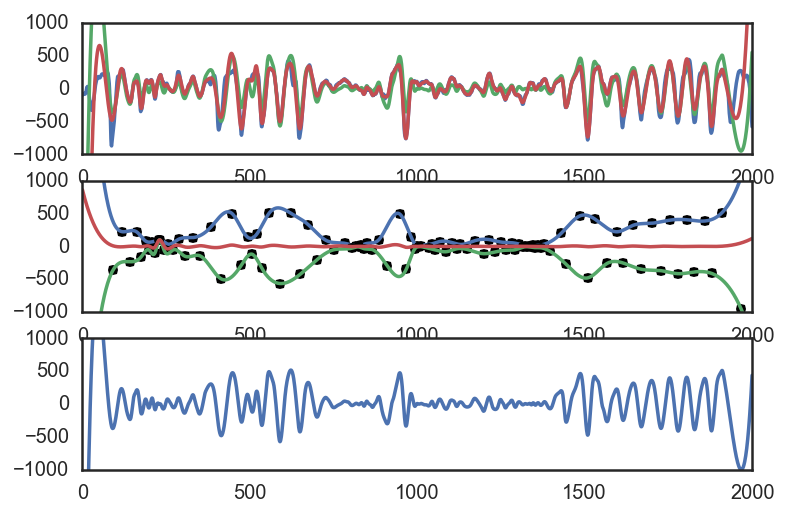

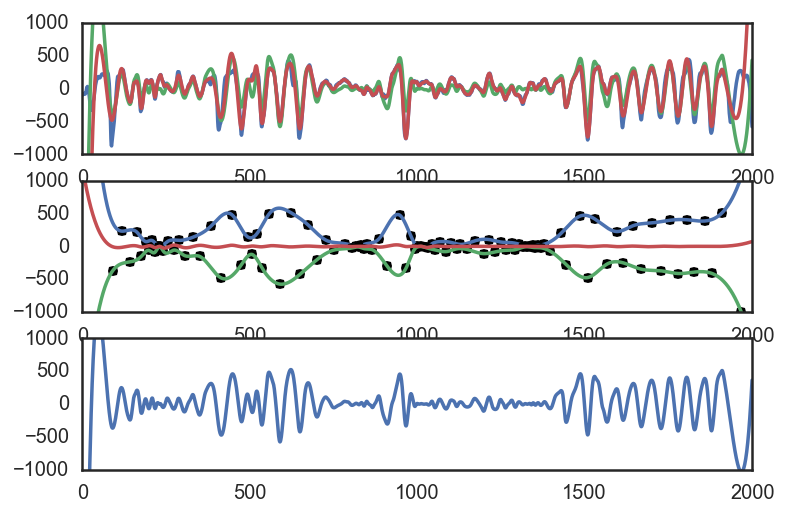

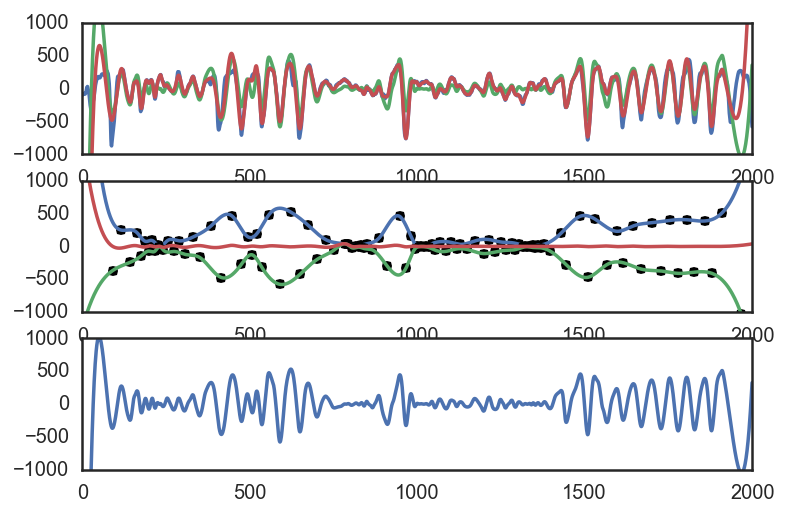

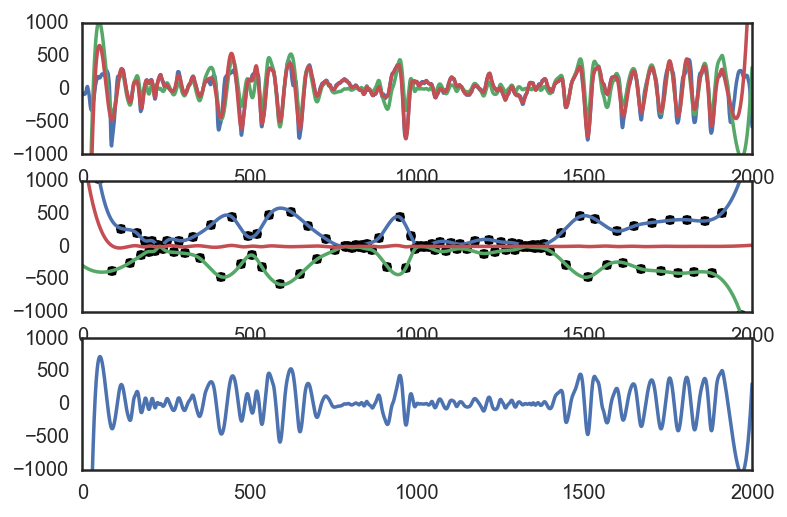

In [172]:
nIMF = 3
imfs = np.zeros(nIMF,dtype=object)
r = x
for i in range(nIMF):
    r_t = r
    is_imf = False
    
    while is_imf == False:
        # Identify peaks and troughs
        pks = sp.signal.argrelmax(r_t)[0]
        trs = sp.signal.argrelmin(r_t)[0]
        
        # Interpolate extrema
        pks_r = r_t[pks]
        fip = sp.interpolate.InterpolatedUnivariateSpline(pks,pks_r,k=3)
        pks_t = fip(range(len(r_t)))
        
        trs_r = r_t[trs]
        fitr = sp.interpolate.InterpolatedUnivariateSpline(trs,trs_r,k=3)
        trs_t = fitr(range(len(r_t)))
        
        # Calculate mean
        mean_t = (pks_t + trs_t) / 2
        
        # Assess if this is an IMF
        sdk = _emd_stop(r_t, mean_t,pks,trs)
        print sdk
        
        # debug: make sure everything looks right, because getting weird interp error after a few iterations; error not converging?
        plt.figure()
        plt.subplot(3,1,1)
        plt.plot(x)
        plt.plot(r_t)
        plt.plot(r)
        plt.ylim((-1000,1000))
        plt.subplot(3,1,2)
        plt.plot(pks,pks_r,'k.',ms=10)
        plt.plot(pks_t)
        plt.plot(trs,trs_r,'k.',ms=10)
        plt.plot(trs_t)
        plt.plot(mean_t)
        plt.ylim((-1000,1000))
        plt.subplot(3,1,3)
        plt.plot(r_t - mean_t)
        plt.ylim((-1000,1000))
                
        # if not imf, update r_t and is_imf
        if sdk < stoplim:
            is_imf = True
        else:
            r_t = r_t - mean_t
            
    
    imfs[i] = r_t
    r = r - imfs[i] 

# 4. Advantages and disadvantages of EMD

Advantages of EMD
* Hilbert
* Compare phase to low pass filter

Disadvantages of EMD
* Choosing a # of components and threshold
* Oscillations spread out among components. (Low pass filter at 100 fix?)

# 5. EMD for PAC

Description of pittman motivation, procedure, and results
example with my data
example with theta data or something that works better